In [1]:
image_paths = {
    '2018': 'dataset/2018/m_3912112_sw_10_060_20180718.tif',
    '2020': 'dataset/2020/m_3912112_sw_10_060_20200709.tif',
    '2022': 'dataset/2022/m_3912112_sw_10_060_20220714.tif'
}

In [7]:
import rasterio

with rasterio.open(image_paths['2018']) as src:
    # Get the bounds of the image (min_lon, min_lat, max_lon, max_lat)
    min_lon, min_lat, max_lon, max_lat = src.bounds
    print(src.crs)
    print(f"Bounds: {min_lon}, {min_lat}, {max_lon}, {max_lat}")

EPSG:26910
Bounds: 617538.0, 4400760.0, 623304.0, 4408086.0


In [3]:
import osmnx as ox

# Define the bounding box using the extracted coordinates from your TIF
north, south, east, west = max_lat, min_lat, max_lon, min_lon

# Define the OSM tags you're interested in (e.g., forests)
tags = {'landuse': 'forest'}  # Or you can refine it based on other tags like 'wood'

# Fetch the OSM data for the defined bounding box
gdf = ox.geometries_from_bbox(north, south, east, west, tags=tags)

# Check the data
print(gdf.head())

/tmp/ipykernel_25983/487723395.py:10: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  gdf = ox.geometries_from_bbox(north, south, east, west, tags=tags)
/home/acharyp/anaconda3/envs/remote_sensing_change_detection/lib/python3.12/site-packages/osmnx/geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  return features.features_from_bbox(north, south, east, west, tags=tags)


RuntimeError: Unable to determine UTM CRS

/tmp/ipykernel_25983/4046018371.py:11: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  G = ox.graph_from_bbox(*bbox, network_type='drive')
/tmp/ipykernel_25983/4046018371.py:15: FutureWarning: The `folium` module has been deprecated and will be removed in the v2.0.0 release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  ox.plot_graph_folium(G, graph_map=None, popup_attribute=None, tiles='openstreetmap', zoom=1)


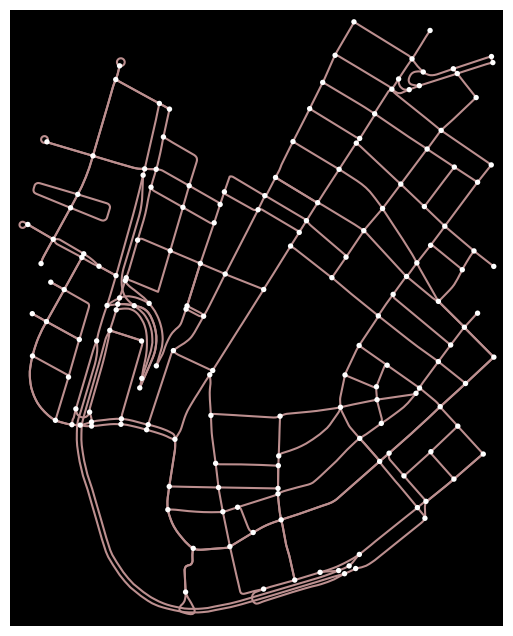

In [4]:
import osmnx as ox
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show

def plot_graph(north, south, east, west):
    # Define the bounding box
    bbox = (north, south, east, west)

    # Create a graph from the bounding box
    G = ox.graph_from_bbox(*bbox, network_type='drive')

    # Plot the graph with a basemap
    fig, ax = ox.plot_graph(G, bgcolor='k', edge_linewidth=1.5, edge_color='#BC8F8F', show=False, close=False)
    ox.plot_graph_folium(G, graph_map=None, popup_attribute=None, tiles='openstreetmap', zoom=1)
    plt.show()

# Example usage
plot_graph(north=40.7128, south=40.6735, east=-74.0060, west=-74.0505)

Original CRS: EPSG:26910
Bounds: 617538.0, 4400760.0, 623304.0, 4408086.0
Converted Bounds: min_lon=-121.62806914714355, min_lat=39.74864916014757, max_lon=-121.55941133903498, max_lat=39.813821225469546


/tmp/ipykernel_25983/3277410629.py:28: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  G = ox.graph_from_bbox(*bbox, network_type='drive')


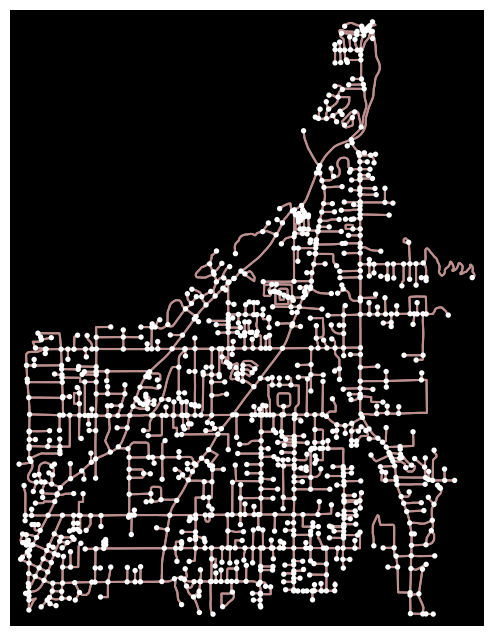

In [9]:
import rasterio
from pyproj import Transformer
import osmnx as ox
import matplotlib.pyplot as plt

def get_lat_lon_bounds(image_path):
    with rasterio.open(image_path) as src:
        # Get the bounds in the original CRS (EPSG:26910)
        min_x, min_y, max_x, max_y = src.bounds
        print(f"Original CRS: {src.crs}")
        print(f"Bounds: {min_x}, {min_y}, {max_x}, {max_y}")

        # Initialize a Transformer to convert EPSG:26910 to EPSG:4326
        transformer = Transformer.from_crs(src.crs, "EPSG:4326", always_xy=True)

        # Transform the bounds to lat/lon
        min_lon, min_lat = transformer.transform(min_x, min_y)
        max_lon, max_lat = transformer.transform(max_x, max_y)

        print(f"Converted Bounds: min_lon={min_lon}, min_lat={min_lat}, max_lon={max_lon}, max_lat={max_lat}")
        return max_lat, min_lat, max_lon, min_lon  # Reorder to (north, south, east, west)

def plot_graph(north, south, east, west):
    # Define the bounding box
    bbox = (north, south, east, west)

    # Create a graph from the bounding box
    G = ox.graph_from_bbox(*bbox, network_type='drive')

    # Plot the graph with a basemap
    fig, ax = ox.plot_graph(G, bgcolor='k', edge_linewidth=1.5, edge_color='#BC8F8F', show=False, close=False)
    plt.show()

# Example usage
tif_path = image_paths["2018"]
north, south, east, west = get_lat_lon_bounds(tif_path)
plot_graph(north=north, south=south, east=east, west=west)


In [12]:
import geopandas as gpd
from shapely.geometry import box
import osmnx as ox

def calculate_forest_area(north, south, east, west):
    """
    Calculates the area of forest in the specified region using OSM data.

    Parameters:
    - north, south, east, west: Latitude and longitude bounds.

    Returns:
    - Forest area in square kilometers.
    """
    # Define a bounding box
    bbox = box(west, south, east, north)

    # Query OSM for land use data in the bounding box
    tags = {"landuse": "trees"}
    gdf = ox.geometries_from_bbox(north, south, east, west, tags)

    if gdf.empty:
        print("No forest data found in the specified region.")
        return 0

    # Ensure the data is in a projected CRS for accurate area calculation
    gdf = gdf.to_crs(epsg=3857)  # Web Mercator projection (meters)

    # Calculate the area of each polygon
    gdf["area_m2"] = gdf.geometry.area

    # Sum up the total area
    total_area_m2 = gdf["area_m2"].sum()

    # Convert to square kilometers
    total_area_km2 = total_area_m2 / 1e6
    print(f"Total forest area: {total_area_km2:.2f} square kilometers")
    return total_area_km2

# Example usage
tif_path = image_paths["2018"]
north, south, east, west = get_lat_lon_bounds(tif_path)
print(f"Bounds: {north:.2f}, {south:.2f}, {east:.2f}, {west:.2f}")
forest_area = calculate_forest_area(north, south, east, west)
print(f"Forest area in the region: {forest_area:.2f} km²")


Original CRS: EPSG:26910
Bounds: 617538.0, 4400760.0, 623304.0, 4408086.0
Converted Bounds: min_lon=-121.62806914714355, min_lat=39.74864916014757, max_lon=-121.55941133903498, max_lat=39.813821225469546
Bounds: 39.81, 39.75, -121.56, -121.63


/tmp/ipykernel_25983/587123560.py:20: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  gdf = ox.geometries_from_bbox(north, south, east, west, tags)
/home/acharyp/anaconda3/envs/remote_sensing_change_detection/lib/python3.12/site-packages/osmnx/geometries.py:48: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  return features.features_from_bbox(north, south, east, west, tags=tags)


InsufficientResponseError: No data elements in server response. Check log and query location/tags.

In [5]:
import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt

# Define the bounding box coordinates
north, south, east, west = 39.762222, 39.757222, -121.621667, -121.628333

# Query OpenStreetMap for forest regions in the bounding box
# tags = {'landuse': 'forest'}
print("Downloading forest data...")
forest_gdf = ox.features_from_bbox(north, south, east, west, tags={})
print("Data download complete!")

# Display the GeoDataFrame
print("Forest GeoDataFrame:")
display(forest_gdf.head())

# Plot the forest regions
print("Plotting forest regions...")
forest_gdf.plot(figsize=(10, 10), color="green", alpha=0.6)
plt.title("Forest Regions in the Specified Area")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# Save the GeoDataFrame to a file (optional)
forest_gdf.to_file("forest_regions.geojson", driver="GeoJSON")
print("Forest regions saved to 'forest_regions.geojson'")

/tmp/ipykernel_62273/1311867114.py:11: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  forest_gdf = ox.features_from_bbox(north, south, east, west, tags={})


InsufficientResponseError: No data elements in server response. Check log and query location/tags.

In [6]:
!pip install overpy

In [7]:
import overpy
import pandas as pd

# Initialize Overpass API
api = overpy.Overpass()

# Define the query for forest regions
query = """
[out:json];
(
  way["landuse"="forest"](39.757222, -121.621667, 39.762222, -121.628333);
  relation["landuse"="forest"](39.757222, -121.621667, 39.762222, -121.628333);
);
out body;
>;
out skel qt;
"""

# Execute the query
print("Querying OpenStreetMap for forest regions...")
result = api.query(query)
print("Query completed!")

# Extract and store results
data = []
for way in result.ways:
    way_id = way.id
    nodes = [(node.lat, node.lon) for node in way.nodes]
    data.append({"Way ID": way_id, "Nodes": nodes})

# Convert results to a DataFrame
forest_df = pd.DataFrame(data)

# Display the DataFrame
print("Forest Data Retrieved:")
forest_df.head()

# Save to a CSV file (optional)
forest_df.to_csv("forest_regions.csv", index=False)
print("Data saved to 'forest_regions.csv'")

Querying OpenStreetMap for forest regions...
Query completed!
Forest Data Retrieved:
Data saved to 'forest_regions.csv'


In [8]:
!pip install folium

In [9]:
import overpy
import pandas as pd
import folium

# Initialize Overpass API
api = overpy.Overpass()

# Define the query for forest regions
query = """
[out:json];
(
  way["landuse"="forest"](39.757222, -121.621667, 39.762222, -121.628333);
  relation["landuse"="forest"](39.757222, -121.621667, 39.762222, -121.628333);
);
out body;
>;
out skel qt;
"""

# Execute the query
print("Querying OpenStreetMap for forest regions...")
result = api.query(query)
print("Query completed!")

# Extract and store results
data = []
for way in result.ways:
    way_id = way.id
    nodes = [(node.lat, node.lon) for node in way.nodes]
    data.append({"Way ID": way_id, "Nodes": nodes})

# Convert results to a DataFrame
forest_df = pd.DataFrame(data)

# Display the DataFrame
print("Forest Data Retrieved:")
display(forest_df.head())

# Plotting the forest regions using Folium
print("Plotting forest regions on map...")
m = folium.Map(location=[39.759722, -121.625], zoom_start=14)

# Add each forest region as a polygon
for _, row in forest_df.iterrows():
    folium.Polygon(
        locations=row["Nodes"],  # List of lat-lon pairs
        color="green",
        fill=True,
        fill_color="green",
        fill_opacity=0.5,
        popup=f"Way ID: {row['Way ID']}"
    ).add_to(m)

# Save the map as an HTML file (optional)
map_filename = "forest_map.html"
m.save(map_filename)
print(f"Map saved to '{map_filename}'")

# Display the map in the notebook
m


Querying OpenStreetMap for forest regions...
Query completed!
Forest Data Retrieved:


,Way ID,Nodes
0,64296148,"[(39.7597976, -123.4855169), (39.7528758, -123..."
1,64296359,"[(39.7613761, -123.1540100), (39.7577221, -123..."
2,64296495,"[(39.7557107, -123.6065256), (39.7523157, -123..."
3,64296539,"[(39.7511106, -123.1397023), (39.7508856, -123..."
4,64296682,"[(39.7655977, -123.2668656), (39.7641865, -123..."


Plotting forest regions on map...
Map saved to 'forest_map.html'


In [11]:
import overpy
import pandas as pd
import folium
from shapely.geometry import Polygon
from shapely.ops import unary_union
import geopandas as gpd

# Initialize Overpass API
api = overpy.Overpass()

# Define the query for forest regions
query = """
[out:json];
(
  way["landuse"="forest"](39.757222, -121.621667, 39.762222, -121.628333);
  relation["landuse"="forest"](39.757222, -121.621667, 39.762222, -121.628333);
);
out body;
>;
out skel qt;
"""

# Execute the query
print("Querying OpenStreetMap for forest regions...")
result = api.query(query)
print("Query completed!")

# Extract and store results
data = []
polygons = []
for way in result.ways:
    way_id = way.id
    nodes = [(node.lat, node.lon) for node in way.nodes]
    # Add the polygon to the list
    if len(nodes) > 2:  # A valid polygon needs at least 3 points
        polygons.append(Polygon([(lon, lat) for lat, lon in nodes]))
    data.append({"Way ID": way_id, "Nodes": nodes})

# Create a GeoDataFrame for forest regions
forest_gdf = gpd.GeoDataFrame({'geometry': polygons}, crs="EPSG:4326")

# Compute the total area of the bounding box
bounding_box = Polygon([(-121.628333, 39.757222), (-121.628333, 39.762222),
                        (-121.621667, 39.762222), (-121.621667, 39.757222)])
bounding_box_gdf = gpd.GeoDataFrame({'geometry': [bounding_box]}, crs="EPSG:4326")

# Reproject to a metric CRS for area calculation
forest_gdf = forest_gdf.to_crs(epsg=3857)
bounding_box_gdf = bounding_box_gdf.to_crs(epsg=3857)

# Compute the area of forests and the bounding box
forest_area = forest_gdf.geometry.area.sum()
bounding_box_area = bounding_box_gdf.geometry.area.iloc[0]

# Calculate the percentage of forest coverage
print(forest_area, bounding_box_area)
forest_percentage = (forest_area / bounding_box_area) * 100
print(f"Forest coverage in the given region: {forest_percentage:.2f}%")

# Plotting the map
m = folium.Map(location=[39.759722, -121.625], zoom_start=14)
for poly in forest_gdf.to_crs(epsg=4326).geometry:
    folium.Polygon(
        locations=[(y, x) for x, y in poly.exterior.coords],
        color="green",
        fill=True,
        fill_color="green",
        fill_opacity=0.5
    ).add_to(m)

# Display the map
m

Querying OpenStreetMap for forest regions...
Query completed!
3309817485.3161535 537281.677443812
Forest coverage in the given region: 616030.22%


In [12]:
!pip install pillow

In [ ]:
from PIL import Image

def convert_tiff_to_image(tiff_file, output_file, output_format="JPEG"):
    """
    Converts a TIFF image to JPEG or PNG format.
    
    Args:
        tiff_file (str): Path to the input TIFF file.
        output_file (str): Path to save the converted image.
        output_format (str): Format of the output image ("JPEG" or "PNG"). Default is "JPEG".
    
    Returns:
        None
    """
    try:
        # Open the TIFF image
        with Image.open(tiff_file) as img:
            # Convert the image mode if needed (e.g., RGBA to RGB for JPEG)
            if output_format == "JPEG" and img.mode in ("RGBA", "LA"):
                img = img.convert("RGB")
            
            # Save the image in the desired format
            img.save(output_file, output_format)
        print(f"Image successfully converted and saved to {output_file}")
    except Exception as e:
        print(f"Error during conversion: {e}")

# ExVample usage
tiff_path = image_paths["2022"]
jpeg_output_path = "test_data/image_2022.jpg"
png_output_path = "test_data/label_2022.png"

# Convert to JPEG
convert_tiff_to_image(tiff_path, jpeg_output_path, "JPEG")

# Convert to PNG
convert_tiff_to_image("labels/saved_labelled_2022.tif", png_output_path, "PNG")

/home/acharyp/anaconda3/envs/remote_sensing_change_detection/lib/python3.12/site-packages/PIL/Image.py:3406: DecompressionBombWarning: Image size (120854900 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


Image successfully converted and saved to test_data/image_2022.jpg
Image successfully converted and saved to test_data/label_2022.png


In [15]:
paths = {
    "2018": {
        "tif_image": image_paths["2018"],
        "label_path": "labels/saved_labelled_2018.tif"
    },
    "2020": {
        "tif_image": image_paths["2020"],
        "label_path": "labels/saved_labelled_2020.tif"
    },
    "2022": {
        "tif_image": image_paths["2022"],
        "label_path": "labels/saved_labelled_2022.tif"
    }
}


for year in paths.keys():
    tif_image = paths[year]["tif_image"]
    label_path = paths[year]["label_path"]
    
    jpg_img_path = f"refined_dataset/images/image_{year}.jpg"
    mask_image_path = f"refined_dataset/masks/mask_{year}.png"

    convert_tiff_to_image(tif_image, jpg_img_path)
    convert_tiff_to_image(label_path, mask_image_path)

Image successfully converted and saved to refined_dataset/images/image_2018.jpg
Image successfully converted and saved to refined_dataset/masks/mask_2018.png
Image successfully converted and saved to refined_dataset/images/image_2020.jpg
Image successfully converted and saved to refined_dataset/masks/mask_2020.png
Image successfully converted and saved to refined_dataset/images/image_2022.jpg
Image successfully converted and saved to refined_dataset/masks/mask_2022.png


In [8]:
import rasterio

# Load the raster into a GeoDataFrame (if applicable)
# This example assumes you have a raster that can be read into a GeoDataFrame

# Load the raster into a GeoDataFrame
with rasterio.open('dataset/2018/m_3912112_sw_10_060_20180718.tif') as src:
    print(src.crs)
    print(src.bounds)

EPSG:26910
BoundingBox(left=617538.0, bottom=4400760.0, right=623304.0, top=4408086.0)


In [9]:
from pyproj import Proj, transform

# Define the projections
utm_proj = Proj(init="epsg:26910")  # NAD83 / UTM zone 10N
wgs84_proj = Proj(init="epsg:4326")  # WGS84

# Convert the corners of the bounding box
left_lon, left_lat = transform(utm_proj, wgs84_proj, 617538.0, 4400760.0)
right_lon, right_lat = transform(utm_proj, wgs84_proj, 623304.0, 4408086.0)

# Output the converted bounding box in WGS84
print(f"Left/Bottom: ({left_lat}, {left_lon})")
print(f"Right/Top: ({right_lat}, {right_lon})")

Left/Bottom: (39.74864916014757, -121.62806914714355)
Right/Top: (39.813821225469546, -121.55941133903498)


/home/acharyp/anaconda3/envs/remote_sensing_change_detection/lib/python3.12/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/home/acharyp/anaconda3/envs/remote_sensing_change_detection/lib/python3.12/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/tmp/ipykernel_14473/2023647485.py:8: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable

In [ ]:
import folium

# Coordinates for the bounding box in WGS84 (latitude, longitude)
southwest = (39.4291, -121.6948)  # Left/Bottom (lat, lon)
northeast = (39.4854, -121.5303)  # Right/Top (lat, lon)

# Create a map centered around the middle of the bounding box
map_center = [(southwest[0] + northeast[0]) / 2, (southwest[1] + northeast[1]) / 2]
mymap = folium.Map(location=map_center, zoom_start=12)

# Draw the bounding box as a rectangle on the map
folium.Rectangle(
    bounds=[southwest, northeast],
    color="blue",
    fill=True,
    fill_opacity=0.2
).add_to(mymap)

# Add a marker at the center of the bounding box
folium.Marker(location=map_center, popup="Center of Bounding Box").add_to(mymap)

# Save the map to an HTML file
mymap.save("paradise_map.html")

# Show the map (in a Jupyter notebook, you can display it inline)
mymap

In [11]:
import folium

# Define the center point and corners of the area
center = [39.7812388, -121.5937555]
nw_corner = [39.815075, -121.6273082]
ne_corner = [39.8142444, -121.5588416]
se_corner = [39.7473916, -121.5602333]
sw_corner = [39.7482221, -121.628636]

# Create a map centered around the center coordinates
mymap = folium.Map(location=center, zoom_start=14)

# Add markers for the center and the four corners
folium.Marker(location=center, popup="Center").add_to(mymap)
folium.Marker(location=nw_corner, popup="NW Corner").add_to(mymap)
folium.Marker(location=ne_corner, popup="NE Corner").add_to(mymap)
folium.Marker(location=se_corner, popup="SE Corner").add_to(mymap)
folium.Marker(location=sw_corner, popup="SW Corner").add_to(mymap)

# Draw a polygon connecting the corners
corner_coords = [nw_corner, ne_corner, se_corner, sw_corner, nw_corner]  # Closing the loop
folium.Polygon(corner_coords, color='blue', fill=True, fill_color='blue', fill_opacity=0.3).add_to(mymap)

# Save the map to an HTML file
mymap.save("map.html")

# Optionally, display the map inline (if using a Jupyter notebook)
mymap

In [2]:
import ee
import folium

# Authenticate and initialize Earth Engine
ee.Initialize()

# Define the region of interest using the coordinates
region = ee.Geometry.Polygon([
    [[-121.6273082, 39.815075],
     [-121.5588416, 39.8142444],
     [-121.5602333, 39.7473916],
     [-121.628636, 39.7482221]]
])

# Load the Sentinel-2 image collection
image_collection = ee.ImageCollection('COPERNICUS/S2') \
    .filterBounds(region) \
    .filterDate('2022-01-01', '2022-12-31') \
    .median()  # Median composite to reduce cloud cover

# Calculate NDVI
ndvi = image_collection.normalizedDifference(['B8', 'B4']).rename('NDVI')

# Mask the areas with high NDVI values (i.e., forests)
forest = ndvi.gt(0.4)  # Threshold for forest cover (NDVI > 0.4)

# Visualize the NDVI and forest cover
forest_map = folium.Map(location=[39.7812388, -121.5937555], zoom_start=12)

# Add NDVI as a background layer
folium.TileLayer(
    tiles=ndvi.getMapId({'min': 0, 'max': 1, 'palette': ['blue', 'white', 'green']}),
    attr='Google Earth Engine',
    name='NDVI'
).add_to(forest_map)

# Add forested areas (where NDVI > 0.4)
folium.TileLayer(
    tiles=forest.getMapId({'min': 0, 'max': 1, 'palette': ['white', 'green']}),
    attr='Google Earth Engine',
    name='Forest Areas'
).add_to(forest_map)

# Display the map
forest_map

ModuleNotFoundError: No module named 'ee'

In [ ]:
import requests

# Define the bounding box (WGS84 coordinates)
sw_lat, sw_lon = 39.4291, -121.6948  # Bottom-left corner
ne_lat, ne_lon = 39.4854, -121.5303  # Top-right corner

# Overpass API endpoint
overpass_url = "http://overpass-api.de/api/interpreter"

# Overpass QL query for forests in the bounding box
overpass_query = f"""
[out:json];
(
  node["landuse"="trees"]({sw_lat},{sw_lon},{ne_lat},{ne_lon});
  way["landuse"="trees"]({sw_lat},{sw_lon},{ne_lat},{ne_lon});
  relation["landuse"="trees"]({sw_lat},{sw_lon},{ne_lat},{ne_lon});
);
out body;
>;
out skel qt;
"""

# Send request to Overpass API
response = requests.get(overpass_url, params={'data': overpass_query})

# Check for successful response
if response.status_code == 200:
    data = response.json()
    print(f"Found {len(data['elements'])} forest elements.")
    # You can process the data further here to extract information, like coordinates, etc.
else:
    print(f"Error: {response.status_code}")

Found 0 forest elements.
